# Data Acquisition
_______________________________________________________________________________________________________________________

# Imports
We will import everything necessary for all connected notebooks such that the user can easily combine all scripts by simply deleting the unnecessary import blocks.

In [1]:
### Michael Engel ### 2022-04-25 ### main.ipynb ###
### adapted by Niklas Eisl, Colin Moldenhauer, 2022/23 ###
import os
import time
from functools import partial
import numpy as np
import datetime as dt

from IPython.display import clear_output

from sentinelhub import SHConfig, BBox, CRS, DataCollection, UtmZoneSplitter, DataCollection, BBoxSplitter
from eolearn.core import FeatureType, RemoveFeatureTask, EONode, EOWorkflow, EOExecutor, SaveTask, OutputTask, linearly_connect_tasks
from eolearn.io import get_available_timestamps, SentinelHubInputTask
from eolearn.mask import JoinMasksTask

import geopandas as gpd
import folium
from folium import plugins as foliumplugins

from libs.ConfigME import Config, get_most_recent_config
from tasks.TDigestTask import TDigestTask


from utils.parse_time_interval_observations import filter_times_reverse_n_obs
from utils.visualization import visualize_timestamp_deltas, plot_samples, visualize_time_intervals
from utils.aoi import split_bbox_list
from tasks.ConditionalTask import ConditionalTask, conditional_node_chain
from tasks.NDVITask import NDVITask
from tasks.SplitReferenceTask import SplitReferenceTask
from tasks.InvertMaskTask import InvertMaskTask

print("Working Directory:", os.getcwd())

# Config File
The basis of a complex program is a config file.
Here, we will use the configuration class established at TUM.
We emphasize that we do not use its full functionalities but showcase the basic benefits of using such a class.
On a first stage, the user can think of it as some fancy dictionary.

Users may provide their own custom config file via its filename, or use the convenience method `get_most_recent_config` in order to find the most current config file.

In [2]:
 #%% load configuration file
config_name = get_most_recent_config(".", pattern="config_.*[.]dill", mode="m")
config = Config.LOAD(config_name)
print("loaded config:", config_name)

# Area of Interest
Let's load our area of interest (AOI). In our case we read the geojson of Bavaria...

In [3]:
aoi = gpd.read_file(config["AOI"])

...estimate its reference system...

In [4]:
crs = aoi.estimate_utm_crs()
aoi = aoi.to_crs(crs)

...and display it.

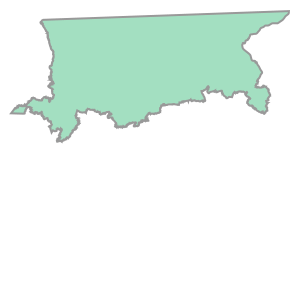

In [5]:
aoi_shape = aoi.geometry.values[0]
aoi_shape

We split the AOI into squares of equal size by using the updated `BBoxSplitter`. The utility method `split_bbox_list` splits the resulting set of bounding boxes into *train*, *validation* and *train* set respectively. It assigns whole columns of boxes to the split, hence, the specified split percentages are only approximately realized.

In [6]:
bbox_splitter = BBoxSplitter([aoi_shape], aoi.crs, split_size=config["patchpixelwidth"]*config["resolution"])
bbox_list_train, bbox_list_val, bbox_list_test = split_bbox_list(bbox_splitter, config["split_percentages"], mode=config["split_direction"])

We verify the resulting split percentages:

In [7]:
boxes_total = sum([len(bboxes) for bboxes in [bbox_list_train, bbox_list_val, bbox_list_test]])
print(f"train: {len(bbox_list_train)} ({len(bbox_list_train) / boxes_total:.2%})")
print(f"val: {len(bbox_list_val)} ({len(bbox_list_val) / boxes_total:.2%})")
print(f"test: {len(bbox_list_test)} ({len(bbox_list_test) / boxes_total:.2%})")

train: 2494 (70.27%)
val: 347 (9.78%)
test: 708 (19.95%)


### Visualization
We visualize the resulting data by displaying the resulting patches on top of a map layer using `folium`. To this end, the AOI is transformed into EPSG:4326 and approximately centered on the map canvas. Additional map controls are added. Overlaps of bounding boxes may occur due to transformation into EPSG:4326 for visualization with `folium`.

In [8]:
aoi_folium = aoi.to_crs("EPSG:4326")
location = [aoi_folium.centroid.y, aoi_folium.centroid.x]

mapwindow = folium.Map(location=location, tiles='Stamen Terrain', zoom_start=8)
folium.LayerControl().add_to(mapwindow)
foliumplugins.Fullscreen(force_separate_button=True).add_to(mapwindow)

On top of the map layer, we visualize the bounding boxes. Training, validation and test patches are displayed as blue, green and red polygons respectively.

In [9]:
split2color = {"train": "blue",
               "val": "green",
               "test": "red"}
bbox_lists = [bbox_list_train, bbox_list_val, bbox_list_test]
for bbox_list_, split in zip(bbox_lists, split2color):
    for i, bbox_ in enumerate(bbox_list_):
        poly = [point[::-1] for point in bbox_.transform("4326").get_polygon()]
        folium.vector_layers.Polygon(
            poly, popup=f"{split} {i}",
            color=split2color[split],
            weight=1,
            fill_color=split2color[split],
            fill_opacity=.3
        ).add_to(mapwindow)
mapwindow.save(os.path.join(config["dir_results"], "AOI_gridmap.html"))
mapwindow.render()
mapwindow

# Data
After defining our area of interest, we can focus on the data we want to use for analysis.
In `eo-learn` we work with tasks: input, intermediate and output.
All tasks **receive a patch and return a patch**.

Input tasks do not demand a patch as an input.
They get some necessary parameters such as our bbox list and desired layers.
Still, they always return `eo-patches`.
Intermediate and output tasks, however, take **and** return patches.
They may save, return or do other things in the meantime as well.

An `ExportToTiffTask`, for example, gets a patch and returns the same one unchanged after exporting it to a GeoTiff.
This ensures that the **tasks may be combined to a workflow** where each task gets and returns a task when executed.
In our example, we will define workflows for input and reference data, respectively, and join them together afterwards.

### General
As an input, we will use a [`SentinelHubInputTask`](https://eo-learn.readthedocs.io/en/latest/reference/eolearn.io.sentinelhub_process.html#eolearn.io.sentinelhub_process.SentinelHubInputTask) for querying **Sentinel-2 data**. Since version 1.3.1 it allows for user-specific selection of timestamps from the set of available timestamps during querying.

As a reference, the **NDVI** will be calculated from the last timestamp of the time series.

Additionally, a cloud mask and no-data mask are retrieved to mask out invalid image areas during training.

In [10]:
# defines a filtering function to select timestamps
timestamp_filter = partial(filter_times_reverse_n_obs, time_difference_observations=config["time_difference"], n_obs=config["num_observations"]+1)

# define input task
task_acquire = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL2_L1C,
    size=None,
    resolution=config["resolution"],
    bands_feature=(FeatureType.DATA, config["feature_name"]),
    bands=config["bands"],
    additional_data=[(FeatureType.MASK, key) for key in ["CLM", "dataMask"]],
    evalscript=None,
    maxcc=config["maxcc"],
    timestamp_filter=timestamp_filter,
    time_difference=config["time_difference_mosaic"],
    cache_folder=None,
    max_threads=config["threads"],
    config=config.SHconfig,
    bands_dtype=np.float32,
    single_scene=False,
    mosaicking_order="mostRecent",
    aux_request_args=None
)

The data downloaded via SentinelHub is then processed via the following tasks:

In [11]:
# split the sequence into inputs and reference and keep both observational data and reference
split_ref_task = SplitReferenceTask(feature_in=(FeatureType.DATA, config["feature_name"]),
                                    feature_out=(FeatureType.DATA, "reference_data"),
                                    remove_feature_in=False)

# split the sequence mask into inputs and reference and keep only the reference masks
split_ref_mask_task = SplitReferenceTask(feature_in=[(FeatureType.MASK, "CLM"),
                                                     (FeatureType.MASK, "dataMask")],
                                         feature_out=[(FeatureType.MASK, "mask_reference_cloud"),
                                                      (FeatureType.MASK, "mask_reference_data")],
                                         remove_feature_in=True)

# invert mask (before: 0=no cloud, 1=cloud; after: 0:invalid due to cloud, 1:valid)
mask_invert_task = InvertMaskTask(feature_in=(FeatureType.MASK, "mask_reference_cloud"))

# join masks for cloud coverage and no data
join_masks_task = JoinMasksTask(input_features=[(FeatureType.MASK, "mask_reference_cloud"),
                                                (FeatureType.MASK, "mask_reference_data")],
                                output_feature=(FeatureType.MASK, "mask_reference"),
                                join_operation="and")

# remove input masks for reference, only the merged mask needs to be saved
remove_masks_task = RemoveFeatureTask(features=[(FeatureType.MASK, "mask_reference_cloud"),
                                                (FeatureType.MASK, "mask_reference_data")])

# create reference by computing and adding NDVI
# remove feature_in to save space, keep it in order to visualize the reference patches with true color data
ndvi_task = NDVITask(feature_in=(FeatureType.DATA, "reference_data"),
                     bands=config["bands"],
                     feature_out=(FeatureType.DATA, "reference"),
                     remove_feature_in=False)

Finally, [t-Digest](https://arxiv.org/abs/1902.04023) features are computed for every patch and the data is saved to file. The `OutputTask` makes the downloaded data available after completion of the workflow, for example for visualization purposes.

In [12]:
task_tdigest = TDigestTask(
    in_feature = (FeatureType.DATA, config["feature_name"]),
    out_feature = (FeatureType.SCALAR_TIMELESS, "tdigest_data"),
    mode = None,
    pixelwise = False
)

# save task
save_task = SaveTask(config["dir_data"], overwrite_permission=2, compress_level=1)
# output task
output_task = OutputTask(name="out")

After creation of the task, we create the corresponding nodes, which will ultimately form the `EOWorkflow`. Until the completion of the mask data, we simply connect the tasks in a linear fashion.

In [13]:
# linearly connected nodes
nodes = linearly_connect_tasks(
    (task_acquire, "Download data"),
    (split_ref_task, "Split ref"), (split_ref_mask_task, "Split ref mask"),
    (mask_invert_task, "Invert mask"), (join_masks_task, "Join masks"), (remove_masks_task, "Remove masks")
)
# assign node variables for later use
node_acquire, node_split_ref, node_split_ref_mask, node_invert_mask, node_merge_masks, node_remove_masks = nodes

In order to save both processing time and disk space, we introduce the `ConditionalTask`, which wraps any `EOTask` and conditions its execution on a custom function. If the condition is true, the contained task executes as normal, if the condition is false, the input patch will be returned unchanged.
The convenience method `conditional_node_chain` connects a series of tasks linearly and conditions the execution of the whole series on a single conditional at the position of the first node.

In this specific case, the computation of the NDVI, the time-consuming TDigest computation and the serialization of data will only be performed if the percentage of valid pixels in the reference is larger than 0.6.

In [14]:
# define function to determine validity of a reference sample
def mask_validity_thresh(patch, feature, thresh=.5):
    p = patch[feature]
    return (p.sum() / p.size) > thresh

conditional_processing = partial(mask_validity_thresh, feature=(FeatureType.MASK, "mask_reference"), thresh=.6)

# define nodes whose execution depends on above function
nodes_cond = conditional_node_chain(conditional_processing,
                                    *[(ndvi_task, "NDVI"), (task_tdigest, "TDigest"), (save_task, "Save Patch")],
                                    inputs=[node_remove_masks],
                                    name="conditional | mask valid",
                                    verbose=False
                                    )
# assign node variables for later use
node_ndvi, node_tdigest, node_save = nodes_cond

In [15]:
# output node
node_out = EONode(output_task, inputs=[node_save], name="Output EOPatch")

We combine the previously created nodes to a workflow. It can be represented graphically (may require installation of `Graphviz`)

In [16]:
workflow = EOWorkflow.from_endnodes(node_out)

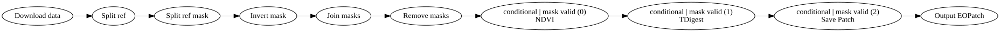

In [17]:
workflow.dependency_graph()

# Workflow Arguments
The only thing missing before we can execute the actual workflow are the workflow arguments, most importantly the `bbox`, i.e. the bounding boxes of the patches we want to download, the time interval and the filename.
We define the parameter `n_obs_addit`, which ensures that the necessary amount of observations lie within the queried interval. From a selected reference timestamp, we define the query interval as `interval_start = interval_end - (n_obs + n_obs_addit) * time_difference`. In case of a missing observation, this approach allows to query for additional observations in order to ensure we download `n_obs` observations.

In [18]:
# ensure repeatability
np.random.seed(config["seed"])

# ensure (n_obs + 1) observations lie within the query interval, by allowing n_obs_addit
n_obs_addit = 3

# instantiate arrays to collect...
# ... the actual workflow arguments
workflow_args = []
# ... info about the timestamps for visualization
all_timestamps = []
all_refs = []
all_diffs = []

def timestamps2diff(timestamps):
    diffs = []
    for i in range(len(timestamps)-1):
        diff = timestamps[i+1] - timestamps[i]
        diffs.append(diff.days)
    return diffs

# setup for ETA computation
counter = 0
num_boxes = sum([len(bbox_list) for bbox_list in [bbox_list_train, bbox_list_val, bbox_list_test]])
tic = time.time()

# loop to assemble the workflow arguments
for split, bboxes in zip(["train", "val", "test"], [bbox_list_train, bbox_list_val, bbox_list_test]):
    for i, bbox in enumerate(bboxes):

        # print progress every 10 iterations
        if not counter%10:
            clear_output(False)
            avg_time = (time.time() - tic) / (counter + 1e-5)
            print(f"{counter}/{num_boxes} ETA: {dt.timedelta(seconds=(num_boxes-counter) * avg_time)} ({avg_time}/it)")

        # combine unique savename for data
        savename = f'{os.path.basename(config[f"dir_{split}"])}/bavaria_{str(bbox.crs).replace(":", "")}_coords{bbox.min_x}_{bbox.min_y}_{bbox.max_x}_{bbox.max_y}_res_{config["resolution"]}_time_{config["time_interval"][0]}_{config["time_interval"][-1]}_maxcc_{config["maxcc"]}'.replace(".", "p")

        # get all available reference timestamps
        timestamps_ = get_available_timestamps(
            bbox = bbox,
            data_collection = DataCollection.SENTINEL2_L1C,
            time_interval = config["time_interval"],
            time_difference = config["time_diff_ref"],
            maxcc = config["maxcc_ref"],
            config = config["SHconfig"]
        )

        # at this point, pick one reference at random and create an observation interval
        timestamp = np.random.choice(timestamps_)
        time_interval_series = (timestamp - (config["num_observations"] + n_obs_addit) * config["time_difference"], timestamp)

        # query timestamp info in advance for visualization and verification
        available_timestamps = get_available_timestamps(
            bbox=bbox,
            data_collection=DataCollection.SENTINEL2_L1C,
            timestamp_filter=timestamp_filter,
            time_interval=time_interval_series,
            maxcc=config["maxcc"],
            config=config["SHconfig"]
        )

        # get timestamps, ref, diffs for visualization
        all_timestamps.extend(available_timestamps[:-1])
        all_refs.append(available_timestamps[-1])
        all_diffs.extend(timestamps2diff(available_timestamps))

        # assign workflow arguments to nodes
        if not os.path.exists(os.path.join(config["dir_data"], savename)):
            workflow_args.append(
                {
                    node_acquire: {"bbox": bbox, "time_interval": time_interval_series},
                    node_split_ref: {"n_reference": 1},
                    node_split_ref_mask: {"n_reference": 1},
                    node_save: {"eopatch_folder": savename}
                }
            )
        counter += 1

print(f"Took {dt.timedelta(seconds=time.time() - tic)} for {counter} bboxes")

3540/3549 ETA: 0:00:03.383181 (0.37590902163034323/it)
Took 0:22:14.142295 for 3549 bboxes


### Pre-Download Verification
Before the time-consuming download, we want to verify that the data we are about to download fulfills certain criteria.

Firstly, we visualize the collected timestamps to ensure a good coverage of samples over the year.

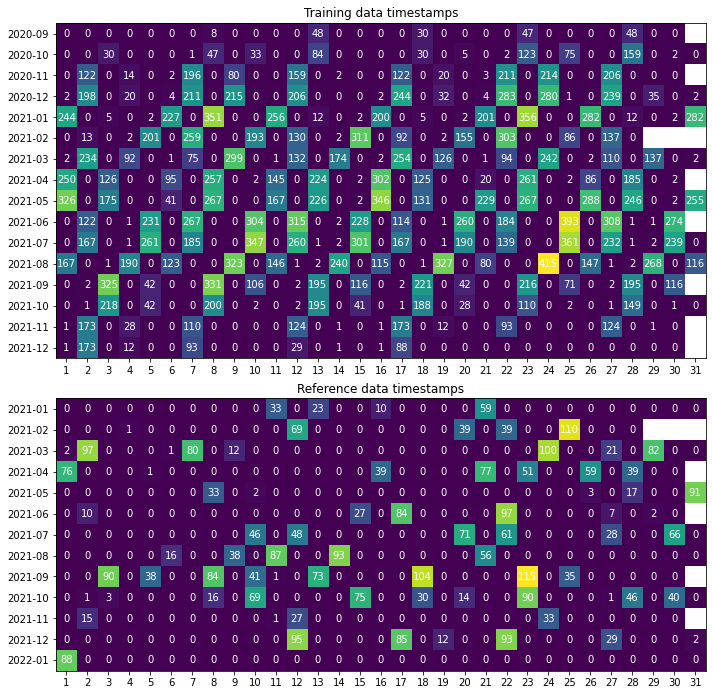

In [19]:
fig = visualize_time_intervals([ts.replace(tzinfo=None) for ts in all_timestamps],
                               [ts.replace(tzinfo=None) for ts in all_refs],
                               figsize=(10, 10))

Secondly, we want to verify the time differences between observations of the same time series. Since we only specify a minimum time difference and don't enforce a maximum time difference, we can't ensure a constant spacing of the observations due to anomalies in the data coverage. In order to get a feel for the impact of mis-spaced samples, we plot the deltas between consecutive observations and create a histogram.
The target difference may not be exactly achieved due to satellite revisit frequency. Slight variations in timestamp deltas can be explained due to rounding. Outliers are caused by irregularities in the data coverage, i.e. missing observations.

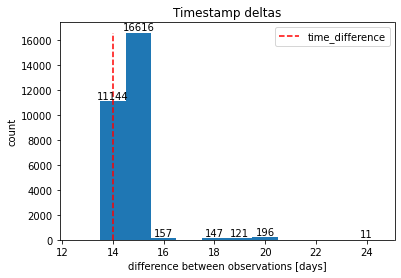

In [20]:
visualize_timestamp_deltas(all_diffs, config["time_difference"])

In order to guarantee that we will download the correct amount of observations, we compare the amount of reference timestamps and the accompanying amount of observational timestamps.

In [21]:
print(f"{len(all_timestamps)} timestamps for {len(all_refs)} refs (factor {len(all_timestamps)/len(all_refs)}):", len(all_timestamps) == (len(all_refs) * (config["num_observations"])))

28392 timestamps for 3549 refs (factor 8.0): True


# Download
The following cell will finally start the `EOWorkflow` by means of an `EOExecutor`, which executes the workflow for all patches included in the workflow arguments.

In [22]:
executor = EOExecutor(workflow, workflow_args, save_logs=True, logs_folder="execution_reports")
results = executor.run(workers=config["threads"])

  0%|          | 0/6 [00:00<?, ?it/s]

### Post-Download Verification
After the download, we verify and analyze the result of our workflow execution.

In [23]:
## sanity checks after download:
# count amount of ignored patches due to invalid reference mask
print("IGNORED PATCHES")
num_downloaded = len(workflow_args)
num_saved = sum([len(os.listdir(config[dir_])) for dir_ in ["dir_train", "dir_val", "dir_test"]])
print(f"\tnum patches:  {num_downloaded: >5}")
print(f"\tnum saved:    {num_saved: >5}")
print(f"\tnum filtered: {num_downloaded - num_saved: >5}  ({(num_downloaded-num_saved)/num_downloaded:.3%})")

IGNORED PATCHES
	num patches:      6
	num saved:        5
	num filtered:     1  (16.667%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


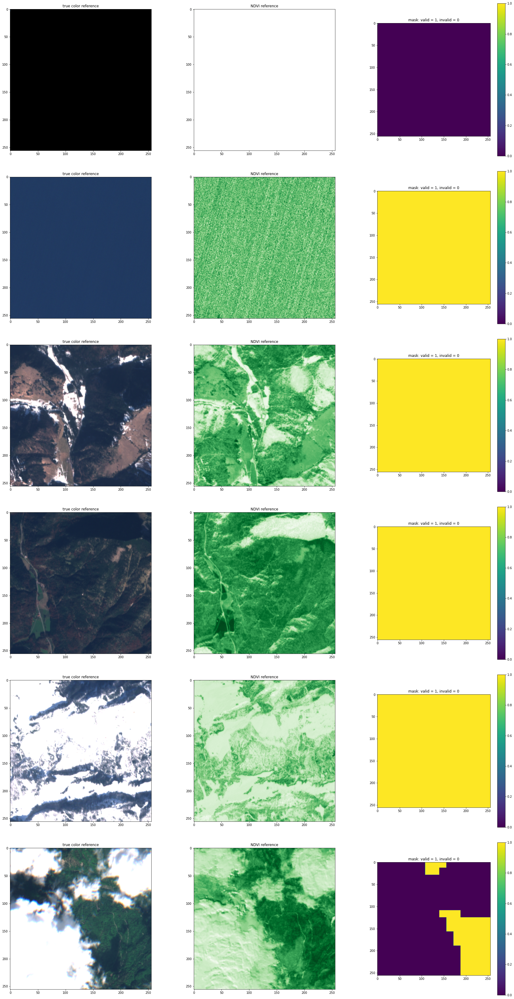

In [24]:
# validate data visually by plotting true color, reference and mask for 10 samples
plot_samples([result.outputs["out"] for result in results], samples=10,
             feature_data=(FeatureType.DATA, "reference_data"),
             feature_reference=(FeatureType.DATA, "reference"),
             feature_mask=(FeatureType.MASK, "mask_reference"))